In [1]:
import numpy as np
import matplotlib.pyplot as plt
import imageio
from glob import glob 

# https://docs.scipy.org/doc/scipy/reference/generated/scipy.ndimage.map_coordinates.html

import scipy 
from scipy import ndimage

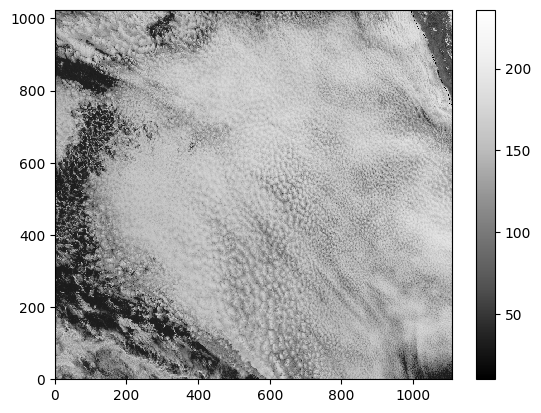

In [28]:
# Define the path to the directory containing the images
path = 'C:\\Users\\ratynski\\Documents\\Python_Projects\\stratocu_waves-main\\DATA\\2022_09_06\\'
# Use glob to find the images in the specified path
fnames = np.sort(glob(path + '*9_06*png'))
images = []

# Read the images and process them
for i, fname in enumerate(fnames):
    img = imageio.v2.imread(fname)
    red = np.flipud(img[:, 400:, 0])
    images.append(red)  # Just red channel, just 400:end in the x dir, flip y

# Plot the first processed image
plt.pcolormesh(images[0], cmap='Greys_r')
plt.colorbar()
plt.show()


In [3]:
# Get the dimensions of the image
height, width = red.shape[:2]

# Create 2D arrays of x and y
x = np.arange(width)
y = np.arange(height)

# Create a meshgrid of x and y
X, Y = np.meshgrid(x, y)


# Pixel size: nominal for MKS units to pixel units 
DX = 2000             # m, pixel size (nominal)

# Xm and Ym are Coordinates in meters, distances measured from central point of image
Xm = (X-X.mean())*DX
Ym = (Y-Y.mean())*DX 

-------------------

# Wave parameters for warping and modulating an image

"In one period, 7–9 October 2008, the waves modulated cloud-top-height by up to 400 m peak-to-trough, propagating perpendicular to the synoptic boundary layer flow with phase speed 15.3 m s−1, period ∼1 h and horizontal wavelength 55 km. The gravity waves were observed to be non-dispersive. “ from https://doi.org/10.1002/qj.1952

For a wave moving toward 45 degrees (northeast), define k and l as positive (sin and cos of nav angle). Let's take z = sin( k(x-ct) + l(y-ct) ) which is indeed moving NEward with time. Then u and v are both positive at z crests (sketch it). That means dx and dy are positve when time is 1/4 period later, or when 90deg of phase have been subtracted since t appears with a negative sign in the formula for phase (x-ct). 

In [4]:
# One wave packet 
cphase = 14            # m/s
wavelength = 150*1000. # meters
period = wavelength/cphase 
direction = 225       # navigation angle of FROM direction in degrees (225 = FROM SW, toward NE) 
zamplitude = 100      # meters, vertical displacement
PBLdepth = 1000       # m, divergent winds assumed to be constant through this layer  

# Wavenumbers computed from wavelengths and direction, units radians per meter
k = 2*np.pi/wavelength * np.sin( (direction) *np.pi/180 )   
l = 2*np.pi/wavelength * np.cos( (direction) *np.pi/180 )   

# Amplitude modulation by a big smooth Gaussian 
packet_center_x = -400*1000  # meters, from middle of Xm, Ym coordinates  
packet_center_y = 400*1000   # meters, from middle of Xm, Ym coordinates  
packet_width_x  = 400*1000.  # meters
packet_width_y  = 300*1000.  # meters
Ampwindow = np.exp(-( ((Xm-packet_center_x)/packet_width_x)**2 + \
                      ((Ym-packet_center_y)/packet_width_y)**2 )) 
     
#plt.pcolormesh(Ampwindow); plt.colorbar()

In [5]:
# A second wave packet 
cphase2 = 20            # m/s
wavelength2 = 100*1000. # meters
period2 = wavelength2/cphase2 
direction2 = 140       # navigation angle of FROM direction in degrees (225 = FROM SW, toward NE) 
zamplitude2 = 50      # meters, vertical displacement
PBLdepth2 = 1000       # m, divergent winds assumed to be constant through this layer  

# Wavenumbers computed from wavelengths and direction, units radians per meter
k2 = 2*np.pi/wavelength2 * np.sin( (direction2) *np.pi/180 )   
l2 = 2*np.pi/wavelength2 * np.cos( (direction2) *np.pi/180 )   

# Amplitude modulation by a big smooth Gaussian 
packet_center_x2 = 400*1000  # meters, from middle of Xm, Ym coordinates  
packet_center_y2 = 100*1000   # meters, from middle of Xm, Ym coordinates  
packet_width_x2  = 200*1000.  # meters
packet_width_y2  = 600*1000.  # meters
Ampwindow2 = np.exp(-( ((Xm-packet_center_x2)/packet_width_x2)**2 + \
                      ( (Ym-packet_center_y2)/packet_width_y2)**2 )) 
     

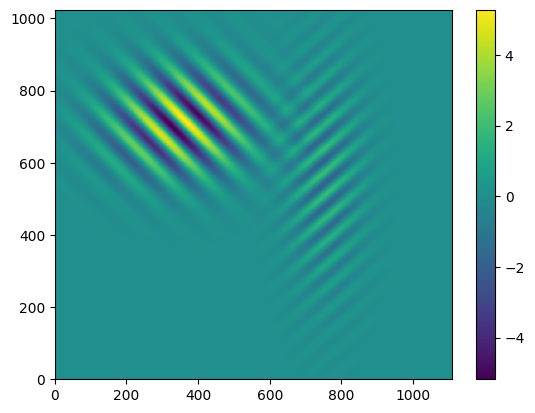

In [6]:
# Constants for this animation 
time_steps = 10            # Number of time steps 
time_resolution = 1800     # seconds, images are half an hour apart

# The resulting image arrays, for animation 
grid = np.zeros((height, width, time_steps))


# BUILD THE WARPED MODULATED IMAGES AT EACH TIME

for it in range(time_steps):
    t = it*time_resolution     # t is in seconds 

# dz measures vertical displacements: let's choose the sine function. Two packets 
    dz = zamplitude \
         * np.sin( k*(Xm - cphase*t)+l*(Ym - cphase*t) ) *Ampwindow 
    dz2 = zamplitude2 \
         * np.sin( k2*(Xm - cphase2*t)+l2*(Ym - cphase2*t) ) *Ampwindow2

# wave dx and dy are 90deg behind phase with dz, prop. to wavelength. 
# DIRECTION: For 45deg (wave going NE), k>0,l>0, dx>0,dy>0 (sketch it). 

    dxy = (zamplitude/PBLdepth)*wavelength \
          * np.sin( k*(Xm - cphase*t)+l*(Ym - cphase*t) -np.pi/2.) /DX
    dx = dxy * np.sin(direction *np.pi/180.) *Ampwindow # why /2? because it is too strong. Pixel units?? 
    dy = dxy * np.cos(direction *np.pi/180.) *Ampwindow

    dxy2= (zamplitude2/PBLdepth2)*wavelength2 \
          * np.sin( k2*(Xm - cphase2*t)+l2*(Ym - cphase2*t) -np.pi/2.) /DX
    dx2= dxy2* np.sin(direction2 *np.pi/180.) *Ampwindow2 
    dy2= dxy2* np.cos(direction2 *np.pi/180.) *Ampwindow2

# Warping by transporting pixels in original red image, wrapping (periodic) for now. SUBTRACT dy and dx in argument. 
    grid[:,:,it] = ndimage.map_coordinates(images[it],[Y-dy-dy2, X-dx-dx2])  

# Modulate (multiply) albedo by a wavy pattern (vertical displacements, 
#           make consistent with xmotion and ymotion arrays above) 
    grid[:,:,it] *= (1 + dz /PBLdepth  *5) 
    grid[:,:,it] *= (1 + dz2/PBLdepth2 *5) 

maxvalue = grid.max()
maxvalue

plt.pcolormesh(dy+dy2); plt.colorbar(); # pixels units -- surprising that 7 pixels make such a huge warp?

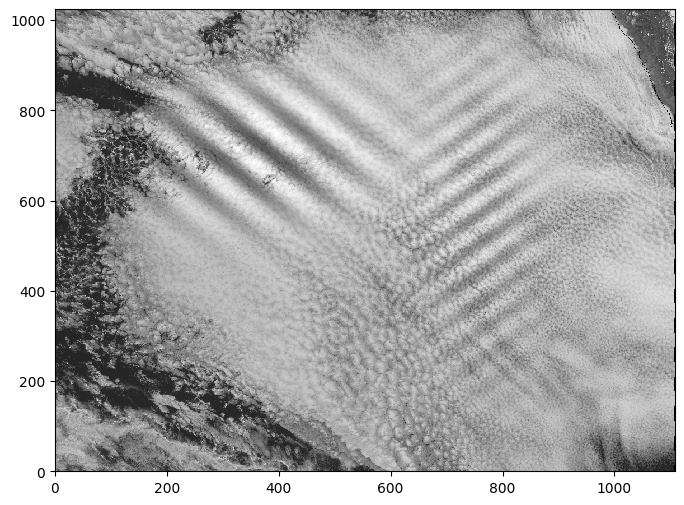

In [7]:
plt.figure(figsize=(8,6))
plt.pcolormesh(grid[:,:,0], cmap='Greys_r')

## Wavelet processing

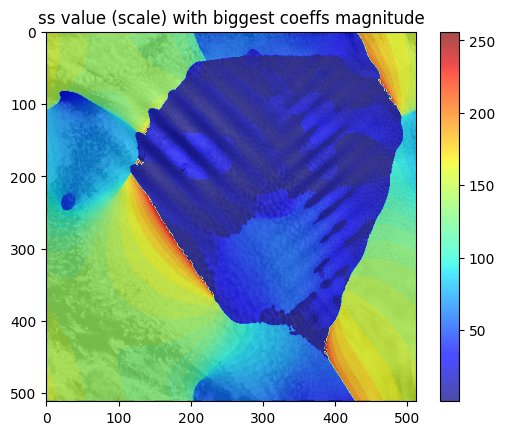

In [8]:
import numpy as np
import pywt
import py_cwt2d
from matplotlib import pyplot as plt

image = np.flipud(grid[::2,::2,0][:512,:512])  #*mask

# set up a range of scales in logarithmic spacing between 1 and 256 (image width / 2 seems to work here)
# small ss apparently means small scale
ss = np.geomspace(1.0,256.0,100)

# calculate the complex pycwt, and make the wavelet normalization factor CC
mother = 'mexh'
coeffs, wav_norm = py_cwt2d.cwt_2d(image, ss, mother)

# normalization factor for each contribution in reconstruction. Is it right? from web repo as found 
CC = 1.0 / (ss * wav_norm) 

# At each point, what scale has largest amplitude? 
# Tile to show the periodic assumption implicit in wavelet analysis

#plt.imshow( np.real(coeffs).max(axis=-1), alpha=0.5); plt.colorbar();   # the big amplitude
#plt.imshow( np.real(coeffs).argmax(axis=-1), alpha=0.5); plt.colorbar(); # the scale number it occurs at

plt.imshow(image, cmap='gray')
plt.imshow( ss[np.real(coeffs).argmax(axis=-1)], alpha=0.7,cmap='jet'); 

plt.colorbar(); # the ss it occurs at

plt.title('ss value (scale) with biggest coeffs magnitude'); 

In [9]:
import numpy as np
from sklearn.cluster import KMeans
from sklearn.cluster import DBSCAN
from sklearn.linear_model import LinearRegression
from scipy.optimize import linear_sum_assignment
from scipy.spatial import distance
import py_cwt2d

# Step 1: Apply the Wavelet Transform to Each Frame in Batches
def apply_wavelet_transform(grid, scales, mother='mexh'):
    num_frames = grid.shape[2]
    coeffs_list = []
    wav_norm_list = []
    for i in range(num_frames):
        image = grid[:,:,i]
        coeffs, wav_norm = py_cwt2d.cwt_2d(image, scales, mother)
        coeffs_list.append(coeffs)
        wav_norm_list.append(wav_norm)

    return coeffs_list, wav_norm_list

# Step 2: Extract Dominant Scales for Each Pixel
def extract_dominant_scales(coeffs_list):
    dominant_scales_list = []

    for coeffs in coeffs_list:
        amplitude = np.real(coeffs)
        dominant_scale = np.argmax(amplitude, axis=-1)
        dominant_scales_list.append(dominant_scale)

    return dominant_scales_list

# Main workflow
images = np.flipud(grid[::2,::2,][:512,:512])  
ss = np.geomspace(1.0,256.0,100)
scales = np.geomspace(1.0, np.max(images.shape)/2, 75)  # Reduced number of scales to save memory
coeffs_list, wav_norm_list = apply_wavelet_transform(images, scales)
dominant_scales_list = extract_dominant_scales(coeffs_list)


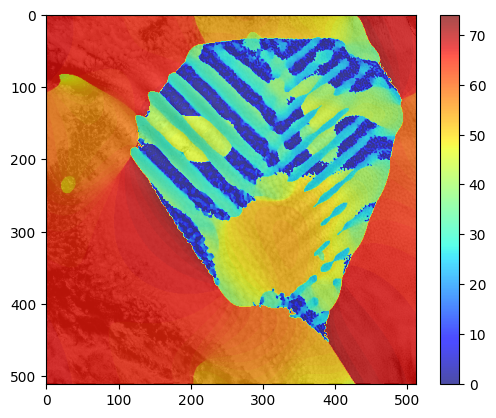

In [10]:
plt.imshow(image, cmap='gray')
plt.imshow(dominant_scales_list[0], alpha=0.7,cmap='jet'); 
plt.colorbar(); # the ss it occurs at

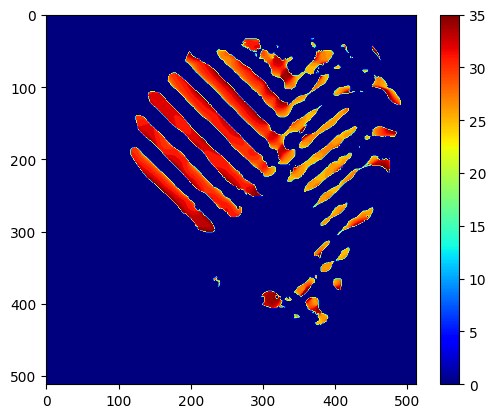

In [11]:
# only keep the scales between 25 and 35 and put the rest to zero
dominant_scales_list = np.array(dominant_scales_list)
dominant_scales_list[(dominant_scales_list < 25) | (dominant_scales_list > 35)] = 0

# plot the dominant scales
plt.imshow(dominant_scales_list[0], cmap='jet')
plt.colorbar()
plt.show()


## Exploration of clustering techniques

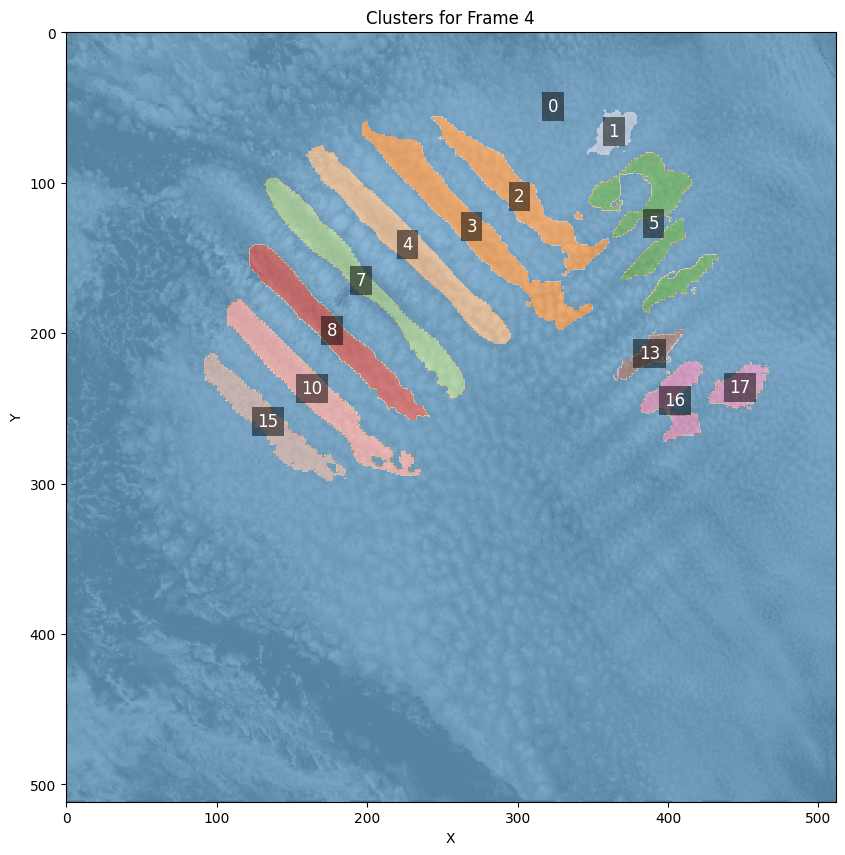

In [12]:
import numpy as np
from sklearn.cluster import DBSCAN
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap

def cluster_nonzero_pixels(dominant_scales_list, eps=20, min_samples=1, size_threshold=150):
    clusters_list = []

    for dominant_scales in dominant_scales_list:
        # Extract coordinates of non-zero elements
        coords_array = np.nonzero(dominant_scales)
        coords_array = np.array(coords_array).T

        # Perform clustering on these coordinates
        dbscan = DBSCAN(eps=eps, min_samples=min_samples)
        labels = dbscan.fit_predict(coords_array)

        # Remove clusters below the size threshold
        unique_labels, counts = np.unique(labels, return_counts=True)
        for label, count in zip(unique_labels, counts):
            if count < size_threshold:
                labels[labels == label] = -1  # Mark as noise

        # Create an array for clusters with the same shape as dominant_scales
        clusters = np.full(dominant_scales.shape, -1, dtype=int)
        clusters[coords_array[:, 0], coords_array[:, 1]] = labels

        clusters_list.append(clusters)

    return clusters_list

def visualize_clusters(grid, clusters, start_frame, end_frame):
    """Visualize the clusters for a range of frames."""
    for frame_index in range(start_frame, end_frame + 1):
        plt.figure(figsize=(10, 10))
        plt.imshow(grid[:, :, frame_index], cmap='gray', alpha=0.5, origin='upper')

        unique_labels = np.unique(clusters[frame_index])
        unique_labels = unique_labels[unique_labels != -1]  # Exclude the -1 label (unclustered points)
        num_labels = len(unique_labels)

        # Generate a colormap with the same number of unique labels
        colormap = ListedColormap(plt.cm.tab20.colors[:num_labels])
        plt.imshow(clusters[frame_index], cmap=colormap, alpha=0.5, origin='upper')

        # Label clusters at their center
        for label in unique_labels:
            mask = clusters[frame_index] == label
            coords = np.column_stack(np.where(mask))
            center = coords.mean(axis=0)
            plt.text(center[1], center[0], str(label), color='white', fontsize=12, ha='center', va='center',
                     bbox=dict(facecolor='black', alpha=0.5, edgecolor='none'))

        plt.title(f'Clusters for Frame {frame_index}')
        plt.xlabel('X')
        plt.ylabel('Y')
        plt.show()

# Perform clustering on non-zero pixels
clusters_list = cluster_nonzero_pixels(dominant_scales_list, eps=10, min_samples=150,size_threshold=500)

# Visualize the clusters for the first 5 frames
visualize_clusters(images, clusters_list, start_frame=4, end_frame=4)
        

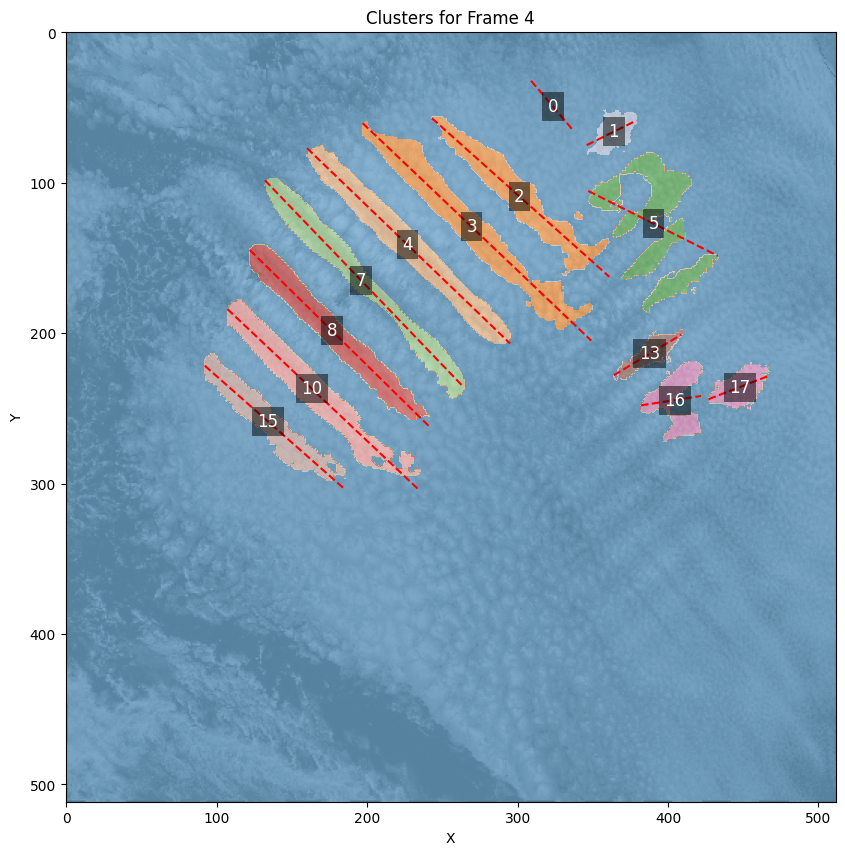

In [13]:
import numpy as np
from sklearn.cluster import DBSCAN
from sklearn.linear_model import LinearRegression
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap

def cluster_nonzero_pixels(dominant_scales_list, eps=20, min_samples=1, size_threshold=150):
    clusters_list = []

    for dominant_scales in dominant_scales_list:
        coords_array = np.nonzero(dominant_scales)
        coords_array = np.array(coords_array).T

        dbscan = DBSCAN(eps=eps, min_samples=min_samples)
        labels = dbscan.fit_predict(coords_array)

        unique_labels, counts = np.unique(labels, return_counts=True)
        for label, count in zip(unique_labels, counts):
            if count < size_threshold:
                labels[labels == label] = -1  # Marquer comme bruit

        clusters = np.full(dominant_scales.shape, -1, dtype=int)
        clusters[coords_array[:, 0], coords_array[:, 1]] = labels

        clusters_list.append(clusters)

    return clusters_list

def fit_linear_regression(coords):
    X = coords[:, 1].reshape(-1, 1)  # Utiliser les coordonnées X pour la régression
    y = coords[:, 0]  # Utiliser les coordonnées Y comme cible
    reg = LinearRegression().fit(X, y)
    return reg.coef_[0], reg.intercept_  # Retourner la pente et l'interception

def analyze_clusters(clusters_list):
    regression_params = []
    for clusters in clusters_list:
        unique_labels = np.unique(clusters)
        unique_labels = unique_labels[unique_labels != -1]

        frame_params = []
        for label in unique_labels:
            mask = clusters == label
            coords = np.column_stack(np.where(mask))
            slope, intercept = fit_linear_regression(coords)
            frame_params.append((label, slope, intercept))

        regression_params.append(frame_params)
    return regression_params

def visualize_clusters(grid, clusters, regression_params, start_frame, end_frame):
    for frame_index in range(start_frame, end_frame + 1):
        plt.figure(figsize=(10, 10))
        plt.imshow(grid[:, :, frame_index], cmap='gray', alpha=0.5, origin='upper')

        unique_labels = np.unique(clusters[frame_index])
        unique_labels = unique_labels[unique_labels != -1]
        num_labels = len(unique_labels)

        colormap = ListedColormap(plt.cm.tab20.colors[:num_labels])
        plt.imshow(clusters[frame_index], cmap=colormap, alpha=0.5, origin='upper')

        for label, slope, intercept in regression_params[frame_index]:
            mask = clusters[frame_index] == label
            coords = np.column_stack(np.where(mask))
            center = coords.mean(axis=0)
            plt.text(center[1], center[0], f'{label}', color='white', fontsize=12, ha='center', va='center',
                     bbox=dict(facecolor='black', alpha=0.5, edgecolor='none'))
            x_vals = np.array([coords[:, 1].min(), coords[:, 1].max()])
            y_vals = intercept + slope * x_vals
            plt.plot(x_vals, y_vals, 'r--')

        plt.title(f'Clusters for Frame {frame_index}')
        plt.xlabel('X')
        plt.ylabel('Y')
        plt.show()


# Clustering des pixels non nuls
clusters_list = cluster_nonzero_pixels(dominant_scales_list, eps=10, min_samples=150,size_threshold=500)

# Analyse des clusters pour trouver les paramètres de régression linéaire
regression_params = analyze_clusters(clusters_list)

# Visualisation des clusters avec les régressions linéaires
visualize_clusters(images, clusters_list, regression_params, start_frame=4, end_frame=4)


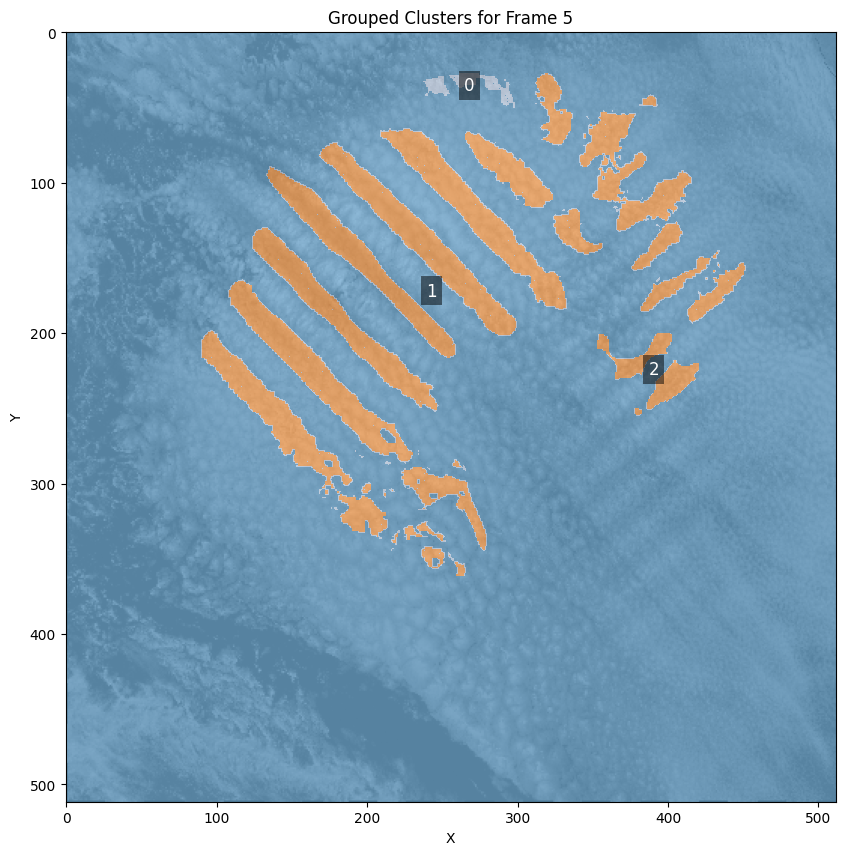

In [14]:
import numpy as np
from sklearn.cluster import DBSCAN
from sklearn.linear_model import LinearRegression
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
from scipy.spatial.distance import euclidean

def cluster_nonzero_pixels(dominant_scales_list, eps=20, min_samples=1, size_threshold=150):
    clusters_list = []

    for dominant_scales in dominant_scales_list:
        coords_array = np.nonzero(dominant_scales)
        coords_array = np.array(coords_array).T

        dbscan = DBSCAN(eps=eps, min_samples=min_samples)
        labels = dbscan.fit_predict(coords_array)

        unique_labels, counts = np.unique(labels, return_counts=True)
        for label, count in zip(unique_labels, counts):
            if count < size_threshold:
                labels[labels == label] = -1

        clusters = np.full(dominant_scales.shape, -1, dtype=int)
        clusters[coords_array[:, 0], coords_array[:, 1]] = labels

        clusters_list.append(clusters)

    return clusters_list

def fit_linear_regression(coords):
    X = coords[:, 1].reshape(-1, 1)
    y = coords[:, 0]
    reg = LinearRegression().fit(X, y)
    return reg.coef_[0], reg.intercept_

def analyze_clusters(clusters_list):
    regression_params = []
    for clusters in clusters_list:
        unique_labels = np.unique(clusters)
        unique_labels = unique_labels[unique_labels != -1]

        frame_params = []
        for label in unique_labels:
            mask = clusters == label
            coords = np.column_stack(np.where(mask))
            slope, intercept = fit_linear_regression(coords)
            frame_params.append((label, slope, intercept, coords))

        regression_params.append(frame_params)
    return regression_params

def group_clusters_by_direction(clusters_params, distance_threshold=50, dot_product_threshold=0.95):
    def find_neighbors(frame_params, cluster_index, distance_threshold, dot_product_threshold):
        queue = [cluster_index]
        visited = set()
        group = []
        
        while queue:
            current_index = queue.pop(0)
            if current_index in visited:
                continue
            visited.add(current_index)
            group.append(current_index)
            
            label_i, slope_i, intercept_i, coords_i = frame_params[current_index]
            vector_i = np.array([1, slope_i])
            
            for neighbor_index, neighbor in enumerate(frame_params):
                if neighbor_index in visited or neighbor_index == current_index:
                    continue
                label_j, slope_j, intercept_j, coords_j = neighbor
                vector_j = np.array([1, slope_j])
                dot_product = np.dot(vector_i, vector_j) / (np.linalg.norm(vector_i) * np.linalg.norm(vector_j))
                
                center_i = coords_i.mean(axis=0)
                center_j = coords_j.mean(axis=0)
                distance = euclidean(center_i, center_j)
                
                if dot_product >= dot_product_threshold and distance <= distance_threshold:
                    queue.append(neighbor_index)
        
        return group

    grouped_clusters = []
    for frame_params in clusters_params:
        visited = set()
        frame_grouped_clusters = []

        for cluster_index, cluster in enumerate(frame_params):
            if cluster_index in visited:
                continue
            group_indices = find_neighbors(frame_params, cluster_index, distance_threshold, dot_product_threshold)
            for index in group_indices:
                visited.add(index)
            frame_grouped_clusters.append([frame_params[i] for i in group_indices])
        
        grouped_clusters.append(frame_grouped_clusters)
    return grouped_clusters

def visualize_grouped_clusters(grid, clusters_list, grouped_clusters, start_frame, end_frame):
    for frame_index in range(start_frame, end_frame + 1):
        plt.figure(figsize=(10, 10))
        plt.imshow(grid[:, :, frame_index], cmap='gray', alpha=0.5, origin='upper')

        cluster_map = np.full(clusters_list[frame_index].shape, -1, dtype=int)
        for group_id, group in enumerate(grouped_clusters[frame_index]):
            for label, slope, intercept, coords in group:
                cluster_map[clusters_list[frame_index] == label] = group_id
        
        unique_labels = np.unique(cluster_map)
        unique_labels = unique_labels[unique_labels != -1]
        num_labels = len(unique_labels)

        colormap = ListedColormap(plt.cm.tab20.colors[:num_labels])
        plt.imshow(cluster_map, cmap=colormap, alpha=0.5, origin='upper')

        for group_id in unique_labels:
            mask = cluster_map == group_id
            coords = np.column_stack(np.where(mask))
            center = coords.mean(axis=0)
            plt.text(center[1], center[0], f'{group_id}', color='white', fontsize=12, ha='center', va='center',
                     bbox=dict(facecolor='black', alpha=0.5, edgecolor='none'))

        plt.title(f'Grouped Clusters for Frame {frame_index}')
        plt.xlabel('X')
        plt.ylabel('Y')
        plt.show()


# Clustering des pixels non nuls
clusters_list = cluster_nonzero_pixels(dominant_scales_list, eps=10, min_samples=50, size_threshold=500)

# Analyse des clusters pour trouver les paramètres de régression linéaire
regression_params = analyze_clusters(clusters_list)

# Regroupement des clusters par direction avec distance de voisinage
grouped_clusters = group_clusters_by_direction(regression_params, distance_threshold=150, dot_product_threshold=0.95)

# Visualisation des clusters regroupés
visualize_grouped_clusters(images, clusters_list, grouped_clusters, start_frame=5, end_frame=5)


C:\Users\ratynski\AppData\Local\Temp\ipykernel_48528\675671747.py:116: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colormap = ListedColormap(plt.cm.get_cmap('tab20', num_labels).colors)


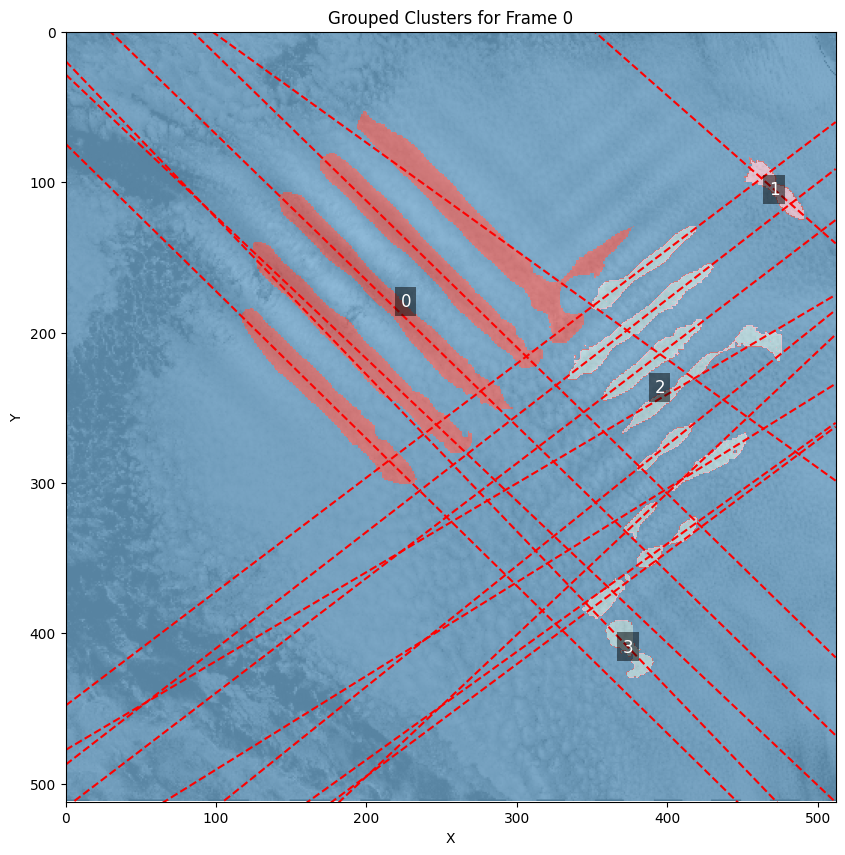

In [15]:
import numpy as np
from sklearn.cluster import DBSCAN
from sklearn.linear_model import LinearRegression
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
from scipy.spatial.distance import euclidean

def cluster_nonzero_pixels(dominant_scales_list, eps=5, min_samples=5, size_threshold=100):
    clusters_list = []

    for dominant_scales in dominant_scales_list:
        coords_array = np.nonzero(dominant_scales)
        coords_array = np.array(coords_array).T

        dbscan = DBSCAN(eps=eps, min_samples=min_samples)
        labels = dbscan.fit_predict(coords_array)

        unique_labels, counts = np.unique(labels, return_counts=True)
        for label, count in zip(unique_labels, counts):
            if count < size_threshold:
                labels[labels == label] = -1

        clusters = np.full(dominant_scales.shape, -1, dtype=int)
        clusters[coords_array[:, 0], coords_array[:, 1]] = labels

        clusters_list.append(clusters)

    return clusters_list

def fit_linear_regression(coords):
    X = coords[:, 1].reshape(-1, 1)
    y = coords[:, 0]
    reg = LinearRegression().fit(X, y)
    r2 = reg.score(X, y)
    return reg.coef_[0], reg.intercept_, r2

def analyze_clusters(clusters_list):
    regression_params = []
    for clusters in clusters_list:
        unique_labels = np.unique(clusters)
        unique_labels = unique_labels[unique_labels != -1]

        frame_params = []
        for label in unique_labels:
            mask = clusters == label
            coords = np.column_stack(np.where(mask))
            slope, intercept, r2 = fit_linear_regression(coords)
            if r2 > 0.5:  # Adjust R^2 threshold as needed
                frame_params.append((label, slope, intercept, coords, r2))

        regression_params.append(frame_params)
    return regression_params

def group_clusters_by_direction(clusters_params, distance_threshold=50, dot_product_threshold=0.95):
    def find_neighbors(frame_params, cluster_index, distance_threshold, dot_product_threshold):
        queue = [cluster_index]
        visited = set()
        group = []
        
        while queue:
            current_index = queue.pop(0)
            if current_index in visited:
                continue
            visited.add(current_index)
            group.append(current_index)
            
            label_i, slope_i, intercept_i, coords_i, _ = frame_params[current_index]
            vector_i = np.array([1, slope_i])
            
            for neighbor_index, neighbor in enumerate(frame_params):
                if neighbor_index in visited or neighbor_index == current_index:
                    continue
                label_j, slope_j, intercept_j, coords_j, _ = neighbor
                vector_j = np.array([1, slope_j])
                dot_product = np.dot(vector_i, vector_j) / (np.linalg.norm(vector_i) * np.linalg.norm(vector_j))
                
                center_i = coords_i.mean(axis=0)
                center_j = coords_j.mean(axis=0)
                distance = euclidean(center_i, center_j)
                
                if dot_product >= dot_product_threshold and distance <= distance_threshold:
                    queue.append(neighbor_index)
        
        return group

    grouped_clusters = []
    for frame_params in clusters_params:
        visited = set()
        frame_grouped_clusters = []

        for cluster_index, cluster in enumerate(frame_params):
            if cluster_index in visited:
                continue
            group_indices = find_neighbors(frame_params, cluster_index, distance_threshold, dot_product_threshold)
            for index in group_indices:
                visited.add(index)
            frame_grouped_clusters.append([frame_params[i] for i in group_indices])
        
        grouped_clusters.append(frame_grouped_clusters)
    return grouped_clusters

def visualize_grouped_clusters(grid, clusters_list, grouped_clusters, start_frame, end_frame, show_regressions=False):
    for frame_index in range(start_frame, end_frame + 1):
        plt.figure(figsize=(10, 10))
        plt.imshow(grid[:, :, frame_index], cmap='gray', alpha=0.5, origin='upper')

        cluster_map = np.full(clusters_list[frame_index].shape, -1, dtype=int)
        for group_id, group in enumerate(grouped_clusters[frame_index]):
            for label, slope, intercept, coords, _ in group:
                cluster_map[clusters_list[frame_index] == label] = group_id
        
        unique_labels = np.unique(cluster_map)
        unique_labels = unique_labels[unique_labels != -1]
        num_labels = len(unique_labels)

        colormap = ListedColormap(plt.cm.get_cmap('tab20', num_labels).colors)
        plt.imshow(cluster_map, cmap=colormap, alpha=0.5, origin='upper')

        plt.xlim(0, grid.shape[1])
        plt.ylim(grid.shape[0], 0)

        for group_id in unique_labels:
            mask = cluster_map == group_id
            coords = np.column_stack(np.where(mask))
            center = coords.mean(axis=0)
            plt.text(center[1], center[0], f'{group_id}', color='white', fontsize=12, ha='center', va='center',
                     bbox=dict(facecolor='black', alpha=0.5, edgecolor='none'))
            if show_regressions:
                for _, slope, intercept, _, _ in grouped_clusters[frame_index][group_id]:
                    x_vals = np.array([0, grid.shape[1]])
                    y_vals = intercept + slope * x_vals
                    plt.plot(x_vals, y_vals, 'r--')

        plt.title(f'Grouped Clusters for Frame {frame_index}')
        plt.xlabel('X')
        plt.ylabel('Y')
        plt.show()


# Clustering des pixels non nuls
clusters_list = cluster_nonzero_pixels(dominant_scales_list, eps=5, min_samples=5, size_threshold=100)

# Analyse des clusters pour trouver les paramètres de régression linéaire
regression_params = analyze_clusters(clusters_list)

# Regroupement des clusters par direction avec distance de voisinage
grouped_clusters = group_clusters_by_direction(regression_params, distance_threshold=100, dot_product_threshold=0.90)

# Visualisation des clusters regroupés avec régressions linéaires
visualize_grouped_clusters(images, clusters_list, grouped_clusters, start_frame=0, end_frame=0, show_regressions=True)


## Finalized version

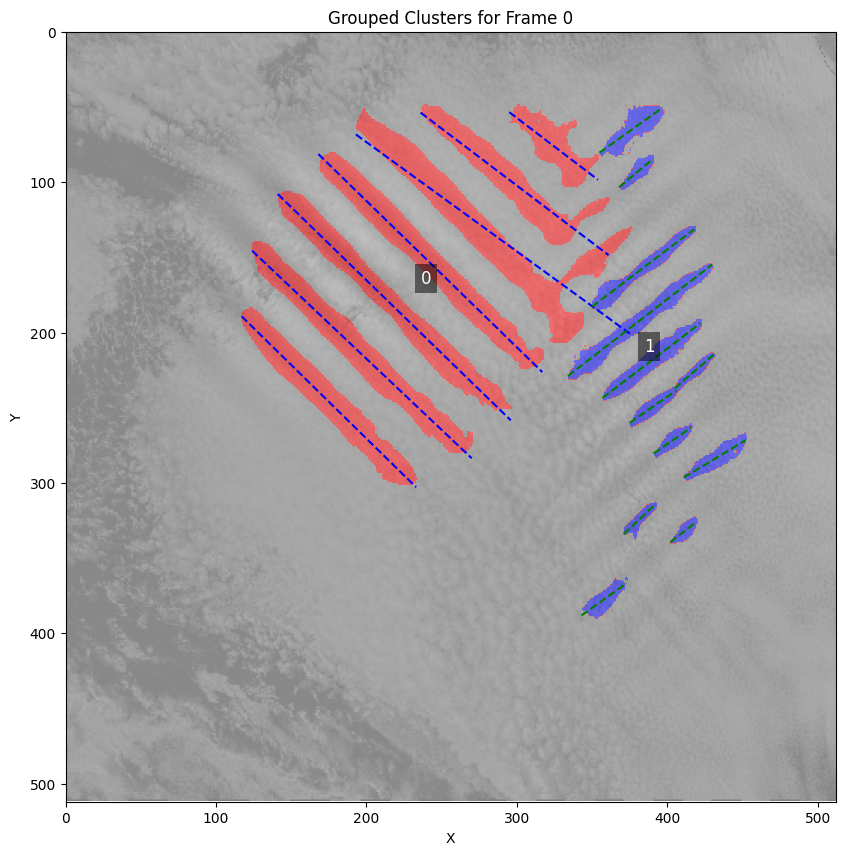

In [16]:
import numpy as np
from sklearn.cluster import DBSCAN
from sklearn.linear_model import LinearRegression
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
from scipy.spatial.distance import euclidean

# Function to cluster non-zero pixels in a list of 2D arrays using DBSCAN
def cluster_nonzero_pixels(dominant_scales_list, eps=5, min_samples=5, size_threshold=100):
    clusters_list = []

    # Loop through each 2D array in the list
    for dominant_scales in dominant_scales_list:
        # Get coordinates of non-zero pixels
        coords_array = np.nonzero(dominant_scales)
        coords_array = np.array(coords_array).T

        # Apply DBSCAN clustering
        dbscan = DBSCAN(eps=eps, min_samples=min_samples)
        labels = dbscan.fit_predict(coords_array)

        # Filter out small clusters based on size_threshold
        unique_labels, counts = np.unique(labels, return_counts=True)
        for label, count in zip(unique_labels, counts):
            if count < size_threshold:
                labels[labels == label] = -1

        # Create a new array with cluster labels
        clusters = np.full(dominant_scales.shape, -1, dtype=int)
        clusters[coords_array[:, 0], coords_array[:, 1]] = labels

        # Append the cluster array to the list
        clusters_list.append(clusters)

    return clusters_list

# Function to fit linear regression to the coordinates of a cluster
def fit_linear_regression(coords):
    X = coords[:, 1].reshape(-1, 1)
    y = coords[:, 0]
    reg = LinearRegression().fit(X, y)
    r2 = reg.score(X, y)
    return reg.coef_[0], reg.intercept_, r2

# Function to analyze clusters and fit linear regression models
def analyze_clusters(clusters_list):
    regression_params = []
    for clusters in clusters_list:
        unique_labels = np.unique(clusters)
        unique_labels = unique_labels[unique_labels != -1]

        frame_params = []
        for label in unique_labels:
            mask = clusters == label
            coords = np.column_stack(np.where(mask))
            slope, intercept, r2 = fit_linear_regression(coords)
            if r2 > 0.5:  # Adjust R^2 threshold as needed
                frame_params.append((label, slope, intercept, coords, r2))

        regression_params.append(frame_params)
    return regression_params

# Function to group clusters by direction and proximity
def group_clusters_by_direction(clusters_params, distance_threshold=50, dot_product_threshold=0.95):
    def find_neighbors(frame_params, cluster_index, distance_threshold, dot_product_threshold):
        queue = [cluster_index]
        visited = set()
        group = []

        # Breadth-first search to find neighbors
        while queue:
            current_index = queue.pop(0)
            if current_index in visited:
                continue
            visited.add(current_index)
            group.append(current_index)

            label_i, slope_i, intercept_i, coords_i, _ = frame_params[current_index]
            vector_i = np.array([1, slope_i])

            # Check all other clusters for neighbors
            for neighbor_index, neighbor in enumerate(frame_params):
                if neighbor_index in visited or neighbor_index == current_index:
                    continue
                label_j, slope_j, intercept_j, coords_j, _ = neighbor
                vector_j = np.array([1, slope_j])
                dot_product = np.dot(vector_i, vector_j) / (np.linalg.norm(vector_i) * np.linalg.norm(vector_j))

                center_i = coords_i.mean(axis=0)
                center_j = coords_j.mean(axis=0)
                distance = euclidean(center_i, center_j)

                # Add to queue if neighbor meets direction and distance thresholds
                if dot_product >= dot_product_threshold and distance <= distance_threshold:
                    queue.append(neighbor_index)

        return group

    grouped_clusters = []
    for frame_params in clusters_params:
        visited = set()
        frame_grouped_clusters = []

        # Group clusters by direction and proximity
        for cluster_index, cluster in enumerate(frame_params):
            if cluster_index in visited:
                continue
            group_indices = find_neighbors(frame_params, cluster_index, distance_threshold, dot_product_threshold)
            if len(group_indices) > 1:  # Ensure the group has more than one regression
                for index in group_indices:
                    visited.add(index)
                frame_grouped_clusters.append([frame_params[i] for i in group_indices])

        grouped_clusters.append(frame_grouped_clusters)
    return grouped_clusters

# Function to visualize grouped clusters with linear regressions
def visualize_grouped_clusters(grid, clusters_list, grouped_clusters, start_frame, end_frame, show_regressions=False):
    distinct_colors = ['r', 'b', 'g', 'p', 'o', 'k', 'c']
    num_colors = len(distinct_colors)
    shifted_colors = distinct_colors[1:] + distinct_colors[:1]  # Shift color palette

    for frame_index in range(start_frame, end_frame + 1):
        plt.figure(figsize=(10, 10))
        plt.imshow(grid[:, :, frame_index], cmap='gray', alpha=0.5, origin='upper')

        cluster_map = np.full(clusters_list[frame_index].shape, -1, dtype=int)
        for group_id, group in enumerate(grouped_clusters[frame_index]):
            for label, slope, intercept, coords, _ in group:
                cluster_map[clusters_list[frame_index] == label] = group_id

        unique_labels = np.unique(cluster_map)
        unique_labels = unique_labels[unique_labels != -1]
        num_labels = len(unique_labels)

        colors = ['gray'] + [distinct_colors[i % num_colors] for i in range(num_labels)]
        regression_colors = [shifted_colors[i % num_colors] for i in range(num_labels)]
        colormap = ListedColormap(colors)
        plt.imshow(cluster_map, cmap=colormap, alpha=0.5, origin='upper')

        plt.xlim(0, grid.shape[1])
        plt.ylim(grid.shape[0], 0)

        for group_id in unique_labels:
            mask = cluster_map == group_id
            coords = np.column_stack(np.where(mask))
            center = coords.mean(axis=0)
            plt.text(center[1], center[0], f'{group_id}', color='white', fontsize=12, ha='center', va='center',
                     bbox=dict(facecolor='black', alpha=0.5, edgecolor='none'))
            if show_regressions:
                for _, slope, intercept, cluster_coords, _ in grouped_clusters[frame_index][group_id]:
                    x_vals = np.array([cluster_coords[:, 1].min(), cluster_coords[:, 1].max()])
                    y_vals = intercept + slope * x_vals
                    plt.plot(x_vals, y_vals, regression_colors[group_id % num_colors] + '--')

        plt.title(f'Grouped Clusters for Frame {frame_index}')
        plt.xlabel('X')
        plt.ylabel('Y')
        plt.show()

# Clustering non-zero pixels
clusters_list = cluster_nonzero_pixels(dominant_scales_list, eps=5, min_samples=50, size_threshold=50)

# Analyzing clusters to find linear regression parameters
regression_params = analyze_clusters(clusters_list)

# Grouping clusters by direction with neighborhood distance
grouped_clusters = group_clusters_by_direction(regression_params, distance_threshold=100, dot_product_threshold=0.95)

# Visualizing grouped clusters with linear regressions
visualize_grouped_clusters(images, clusters_list, grouped_clusters, start_frame=0, end_frame=0, show_regressions=True)


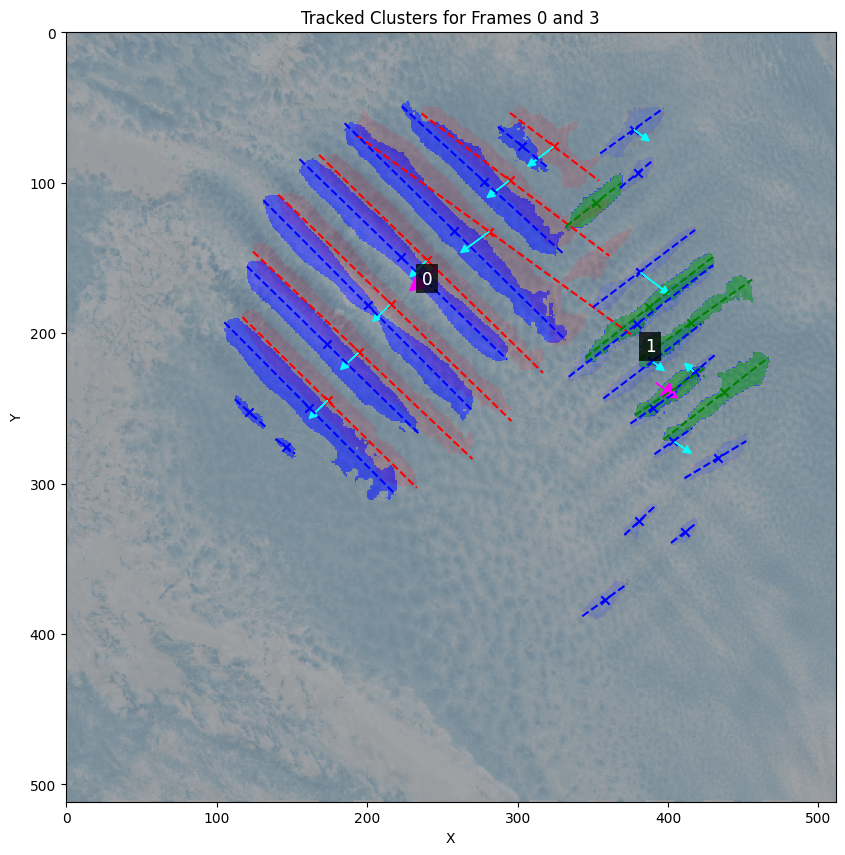

In [17]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap

def visualize_mean_displacement_for_clusters(grid, clusters_list, grouped_clusters, frame_index, frame_tick=1, distance_threshold=50, direction_threshold=0.95, show_regressions=False, show_individual_arrows=True, show_both_labels=True):
    # Define distinct colors for different clusters
    distinct_colors = ['r', 'b', 'g', 'p', 'o', 'k', 'c']
    num_colors = len(distinct_colors)
    
    # Calculate the index for the next frame based on frame_tick
    next_frame_index = frame_index + frame_tick

    # Extract current and next frame clusters
    current_frame = grouped_clusters[frame_index]
    next_frame = grouped_clusters[next_frame_index]

    # Create a new figure for visualization
    plt.figure(figsize=(10, 10))

    # Visualization of the current frame
    plt.imshow(grid[:, :, frame_index], cmap='gray', alpha=0.5, origin='upper')

    # Create a cluster map for the current frame
    cluster_map = np.full(clusters_list[frame_index].shape, -1, dtype=int)
    for group_id, group in enumerate(grouped_clusters[frame_index]):
        for label, slope, intercept, coords, _ in group:
            cluster_map[clusters_list[frame_index] == label] = group_id

    # Get unique labels and assign colors
    unique_labels = np.unique(cluster_map)
    unique_labels = unique_labels[unique_labels != -1]
    num_labels = len(unique_labels)

    colors = [distinct_colors[i % num_colors] for i in range(num_labels)]
    colormap = ListedColormap(['gray'] + colors)
    plt.imshow(cluster_map, cmap=colormap, alpha=0.5, origin='upper')

    # Plot regression lines and cluster centers for the current frame
    for group_id in unique_labels:
        mask = cluster_map == group_id
        coords = np.column_stack(np.where(mask))
        center = coords.mean(axis=0)
        plt.text(center[1], center[0], f'{group_id}', color='white', fontsize=12, ha='center', va='center',
                 bbox=dict(facecolor='black', alpha=0.5, edgecolor='none'))
        if show_regressions:
            for _, slope, intercept, cluster_coords, _ in grouped_clusters[frame_index][group_id]:
                x_vals = np.array([cluster_coords[:, 1].min(), cluster_coords[:, 1].max()])
                y_vals = intercept + slope * x_vals
                plt.plot(x_vals, y_vals, colors[group_id % num_colors] + '--')
                plt.scatter(cluster_coords[:, 1].mean(), cluster_coords[:, 0].mean(), color=colors[group_id % num_colors], marker='x')

    # Visualization of the next frame
    plt.imshow(grid[:, :, next_frame_index], cmap='Blues', alpha=0.5, origin='upper')

    # Create a cluster map for the next frame
    next_cluster_map = np.full(clusters_list[next_frame_index].shape, -1, dtype=int)
    for group_id, group in enumerate(grouped_clusters[next_frame_index]):
        for label, slope, intercept, coords, _ in group:
            next_cluster_map[clusters_list[next_frame_index] == label] = group_id

    # Get unique labels and assign colors
    next_unique_labels = np.unique(next_cluster_map)
    next_unique_labels = next_unique_labels[next_unique_labels != -1]
    next_num_labels = len(next_unique_labels)

    next_colors = [distinct_colors[(i + 1) % num_colors] for i in range(next_num_labels)]
    next_colormap = ListedColormap(['gray'] + next_colors)
    plt.imshow(next_cluster_map, cmap=next_colormap, alpha=0.5, origin='upper')

    # Plot regression lines and cluster centers for the next frame
    for group_id in next_unique_labels:
        mask = next_cluster_map == group_id
        coords = np.column_stack(np.where(mask))
        center = coords.mean(axis=0)
        if show_both_labels:
            plt.text(center[1], center[0], f'{group_id}', color='black', fontsize=12, ha='center', va='center',
                     bbox=dict(facecolor='white', alpha=0.5, edgecolor='none'))
        if show_regressions:
            for _, slope, intercept, cluster_coords, _ in grouped_clusters[next_frame_index][group_id]:
                x_vals = np.array([cluster_coords[:, 1].min(), cluster_coords[:, 1].max()])
                y_vals = intercept + slope * x_vals
                plt.plot(x_vals, y_vals, next_colors[group_id % num_colors] + '--')
                plt.scatter(cluster_coords[:, 1].mean(), cluster_coords[:, 0].mean(), color=next_colors[group_id % num_colors], marker='x')

    plt.title(f'Tracked Clusters for Frames {frame_index} and {next_frame_index}')
    plt.xlabel('X')
    plt.ylabel('Y')

    # Set to keep track of used clusters in the next frame to avoid double coupling
    next_frame_used = set()

    # Iterate over the current frame clusters
    for step, current_group in enumerate(current_frame):
        current_group_displacements = []
        for i, (curr_label, curr_slope, curr_intercept, curr_coords, _) in enumerate(current_group):
            curr_center = curr_coords.mean(axis=0)
            direction_vector = np.array([1, curr_slope])
            direction_vector /= np.linalg.norm(direction_vector)
            perpendicular_vector = np.array([-direction_vector[1], direction_vector[0]])

            best_match = None
            best_displacement = None
            min_proj_distance = float('inf')

            # Find the best match for the current cluster in the next frame
            for next_group in next_frame:
                for j, (next_label, next_slope, next_intercept, next_coords, _) in enumerate(next_group):
                    if next_label in next_frame_used:
                        continue
                    if np.abs(curr_slope - next_slope) <= direction_threshold:
                        next_center = next_coords.mean(axis=0)
                        displacement = next_center - curr_center
                        perp_displacement = np.dot(displacement, perpendicular_vector) * perpendicular_vector
                        proj_distance = np.linalg.norm(perp_displacement)

                        if proj_distance <= distance_threshold and proj_distance < min_proj_distance:
                            min_proj_distance = proj_distance
                            best_match = next_label
                            best_displacement = perp_displacement

            # If a best match is found, draw the arrow and mark the cluster as used
            if best_match is not None:
                next_frame_used.add(best_match)
                if show_individual_arrows:
                    plt.arrow(curr_center[1], curr_center[0], best_displacement[1], best_displacement[0],
                              head_width=5, head_length=5, fc='cyan', ec='cyan')
                current_group_displacements.append(best_displacement)

        # Calculate and draw the mean displacement arrow
        if current_group_displacements:
            mean_displacement = np.mean(current_group_displacements, axis=0)
            mean_displacement_center = np.mean([coords.mean(axis=0) for _, _, _, coords, _ in current_group], axis=0)
            plt.arrow(mean_displacement_center[1], mean_displacement_center[0], mean_displacement[1], mean_displacement[0],
                      head_width=10, head_length=10, fc='magenta', ec='magenta', label='Mean Displacement')

    # Plot labels for clusters if only showing one label
    if not show_both_labels:
        for group_id in unique_labels:
            mask = cluster_map == group_id
            coords = np.column_stack(np.where(mask))
            center = coords.mean(axis=0)
            plt.text(center[1], center[0], f'{group_id}', color='white', fontsize=12, ha='center', va='center',
                     bbox=dict(facecolor='black', alpha=0.5, edgecolor='none'))

    # Show the plot with legend
    # plt.legend() # Uncomment this line if you want to show the legend
    plt.show()

# Use the function to visualize the mean displacements for each cluster
visualize_mean_displacement_for_clusters(images, clusters_list, grouped_clusters, frame_index=0, frame_tick=3, distance_threshold=20, direction_threshold=0.95, show_regressions=True, show_individual_arrows=True, show_both_labels=False)


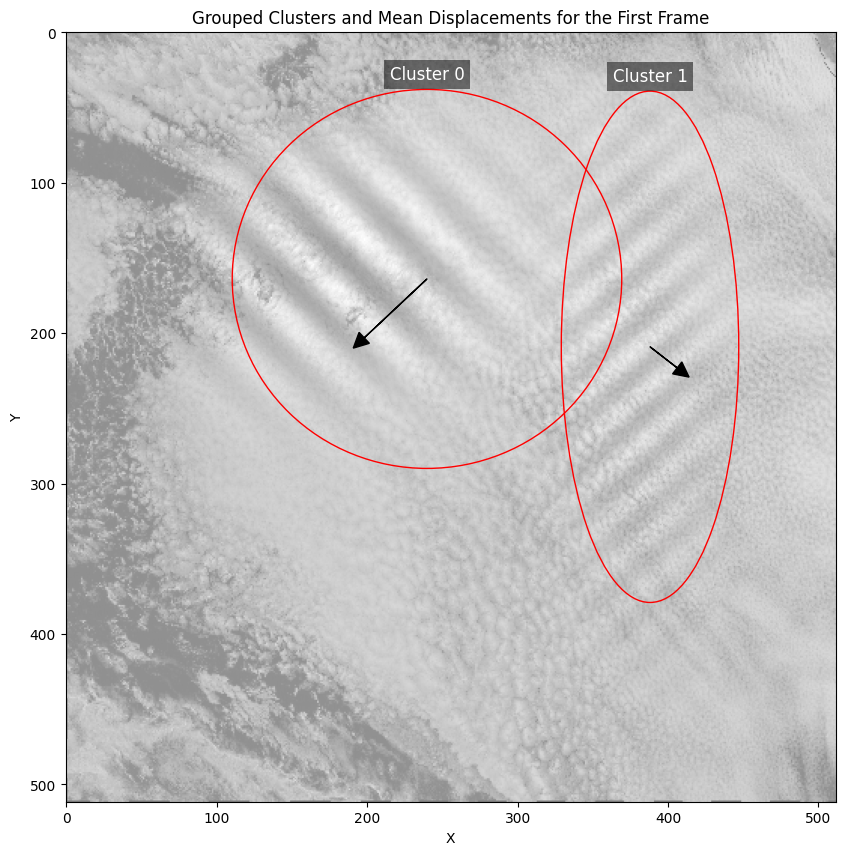

Cluster 0: Center=[163.87014407 239.7607817 ], Speed=61.05 km/h, Wavelength=149.12 km, Direction=-46.81 degrees
Cluster 1: Center=[209.00613165 388.06474301], Speed=24.40 km/h, Wavelength=91.37 km, Direction=52.20 degrees


In [21]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.patches import Ellipse

def compute_mean_displacement_for_all_frames(grouped_clusters, frame_tick=1, distance_threshold=50, direction_threshold=0.95):
    all_frame_displacements = {}

    for frame_index in range(len(grouped_clusters) - frame_tick):
        next_frame_index = frame_index + frame_tick
        current_frame = grouped_clusters[frame_index]
        next_frame = grouped_clusters[next_frame_index]

        next_frame_used = set()

        for step, current_group in enumerate(current_frame):
            current_group_displacements = []
            for i, (curr_label, curr_slope, curr_intercept, curr_coords, _) in enumerate(current_group):
                curr_center = curr_coords.mean(axis=0)
                direction_vector = np.array([1, curr_slope])
                direction_vector /= np.linalg.norm(direction_vector)
                perpendicular_vector = np.array([-direction_vector[1], direction_vector[0]])

                best_match = None
                best_displacement = None
                min_proj_distance = float('inf')

                for next_group in next_frame:
                    for j, (next_label, next_slope, next_intercept, next_coords, _) in enumerate(next_group):
                        if next_label in next_frame_used:
                            continue
                        if np.abs(curr_slope - next_slope) <= direction_threshold:
                            next_center = next_coords.mean(axis=0)
                            displacement = next_center - curr_center
                            perp_displacement = np.dot(displacement, perpendicular_vector) * perpendicular_vector
                            proj_distance = np.linalg.norm(perp_displacement)

                            if proj_distance <= distance_threshold and proj_distance < min_proj_distance:
                                min_proj_distance = proj_distance
                                best_match = next_label
                                best_displacement = perp_displacement

                if best_match is not None:
                    next_frame_used.add(best_match)
                    current_group_displacements.append(best_displacement)

            if current_group_displacements:
                mean_displacement = np.mean(current_group_displacements, axis=0)
                if step not in all_frame_displacements:
                    all_frame_displacements[step] = []
                all_frame_displacements[step].append(mean_displacement)

    final_mean_displacements = {key: np.mean(value, axis=0).tolist() for key, value in all_frame_displacements.items()}

    return final_mean_displacements

def total_least_squares(coords, perp_slope):
    X = coords[:, 1]
    y = coords[:, 0]
    A = np.vstack([X, np.ones(len(X))]).T
    b = y + perp_slope * X
    fit_params = np.linalg.lstsq(A, b, rcond=None)[0]
    return fit_params[0], fit_params[1]

def calculate_distances(intersections):
    if len(intersections) > 1:
        distances = np.sqrt(np.sum(np.diff(intersections, axis=0)**2, axis=1))
        return distances
    return np.array([])

def filter_outliers(distances, threshold_factor=1.5):
    if len(distances) == 0:
        return distances
    median = np.median(distances)
    mad = np.median(np.abs(distances - median))
    threshold = threshold_factor * mad
    return distances[(distances >= median - threshold) & (distances <= median + threshold)]

def compute_wavelength_across_frames(grouped_clusters, cluster_id):
    wavelengths = []

    for frame_idx in range(len(grouped_clusters)):
        cluster = grouped_clusters[frame_idx][cluster_id]
        slopes = [item[1] for item in cluster]
        coords = [item[3] for item in cluster]

        avg_slope = np.mean(slopes)
        perp_slope = -1 / avg_slope

        all_coords = np.vstack(coords)
        perp_intercept = total_least_squares(all_coords, perp_slope)[1]

        intersections = []
        for _, slope, intercept, coords, _ in cluster:
            x_intersect = (intercept - perp_intercept) / (perp_slope - slope)
            y_intersect = slope * x_intersect + intercept
            intersections.append((x_intersect, y_intersect))

        intersections = np.array(intersections)
        distances = calculate_distances(intersections)

        if distances.size > 0:
            filtered_distances = filter_outliers(distances)
            if filtered_distances.size > 0:
                wavelengths.append(np.mean(filtered_distances) * 2)  # Convert pixel to km

    if wavelengths:
        return np.median(wavelengths)  # Or use np.mean(wavelengths) if preferred

    return 0  # Return 0 if no valid wavelength is found

# Compute mean displacements
mean_displacements = compute_mean_displacement_for_all_frames(grouped_clusters, frame_tick=3, distance_threshold=50, direction_threshold=0.95)

frame_tick = 3

# Visualize the first frame
plt.figure(figsize=(10, 10))
plt.imshow(images[:, :, 0], cmap='gray', alpha=0.5, origin='upper')

cluster_info = {}

# Iterate over each grouped cluster
for cluster_id, grouped_cluster in enumerate(grouped_clusters[0]):
    all_coords = np.concatenate([coords for _, _, _, coords, _ in grouped_cluster])
    center = all_coords.mean(axis=0)
    width = all_coords[:, 1].max() - all_coords[:, 1].min()
    height = all_coords[:, 0].max() - all_coords[:, 0].min()
    ellipse = Ellipse((center[1], center[0]), width, height, edgecolor='r', facecolor='none')
    plt.gca().add_patch(ellipse)

    # Draw the mean displacement arrow for the grouped cluster
    if cluster_id in mean_displacements:
        mean_disp = np.array(mean_displacements[cluster_id])
        # Make the arrows longer
        arrow_scale = 5  # Scale factor to make arrows larger
        plt.arrow(center[1], center[0], arrow_scale * mean_disp[1], arrow_scale * mean_disp[0], head_width=10, head_length=10, fc='black', ec='black')
        cluster_info[cluster_id] = {
            "center": center,
            "mean_displacement": mean_disp,
            "group": grouped_cluster
        }

    # Label the grouped cluster above the ellipse
    plt.text(center[1], center[0] - height / 2 - 10, f'Cluster {cluster_id}', color='white', fontsize=12, ha='center', va='center',
            bbox=dict(facecolor='black', alpha=0.5, edgecolor='none'))

plt.title('Grouped Clusters and Mean Displacements for the First Frame')
plt.xlabel('X')
plt.ylabel('Y')
plt.show()

# Calculate speed, wavelength, and direction
speed = {}
wavelength = {}
direction = {}

for cluster_id, info in cluster_info.items():
    disp = info["mean_displacement"]
    speed[cluster_id] = np.linalg.norm(disp) * 2 * 2 / (15*frame_tick / 60)  # in km/h multplied by 2 because of the downsampling   
    wavelength[cluster_id] = compute_wavelength_across_frames(grouped_clusters, cluster_id) * 2  # in km multplied by 2 because of the downsampling
    direction[cluster_id] = np.degrees(np.arctan2(disp[1], disp[0]))

for cluster_id, info in cluster_info.items():
    print(f'Cluster {cluster_id}: Center={info["center"]}, Speed={speed[cluster_id]:.2f} km/h, Wavelength={wavelength[cluster_id]:.2f} km, Direction={direction[cluster_id]:.2f} degrees')


## Streamlined Analysis

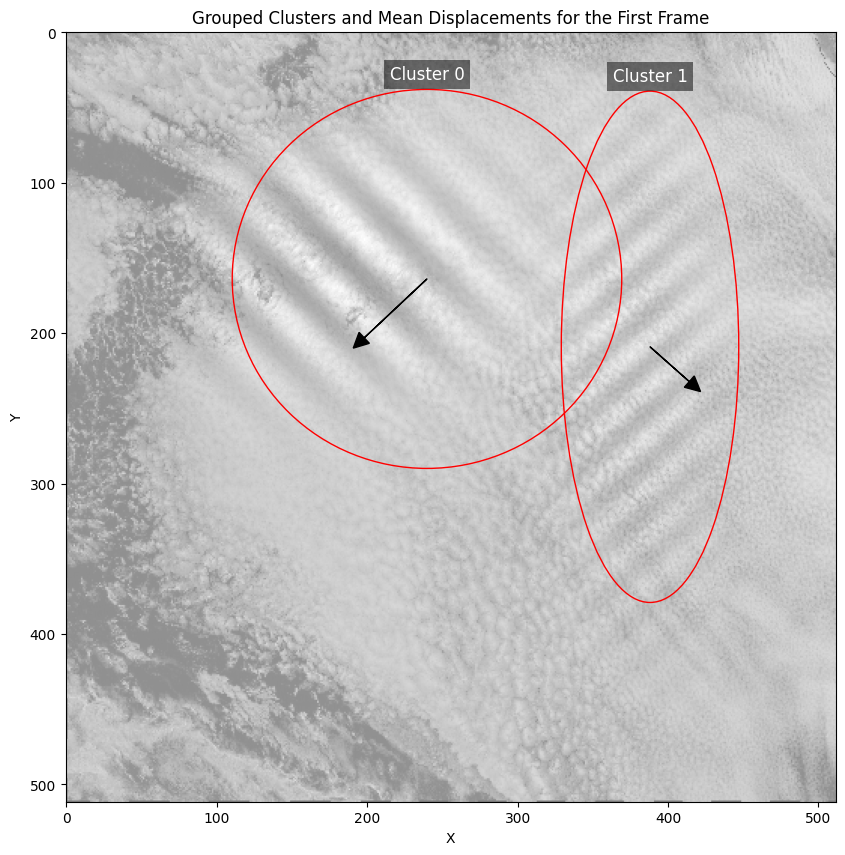

Cluster 0: Center=[163.87014407 239.7607817 ], Speed=61.05 km/h, Wavelength=149.12 km, Direction=-46.81 degrees
Cluster 1: Center=[209.00613165 388.06474301], Speed=37.22 km/h, Wavelength=91.37 km, Direction=48.47 degrees


In [22]:
def detect_waves(grid, mother='mexh', frame_tick=3, distance_threshold=100, direction_threshold=0.95,dot_product_threshold=0.95, eps=5, min_samples=50, size_threshold=50):
    images = np.flipud(grid[::2,::2,][:512,:512])  
    ss = np.geomspace(1.0,256.0,100)
    scales = np.geomspace(1.0, np.max(images.shape)/2, 75)  # Reduced number of scales to save memory
    coeffs_list, wav_norm_list = apply_wavelet_transform(images, scales,mother=mother)
    dominant_scales_list = extract_dominant_scales(coeffs_list)
    dominant_scales_list = np.array(dominant_scales_list)
    dominant_scales_list[(dominant_scales_list < 25) | (dominant_scales_list > 35)] = 0

    clusters_list = cluster_nonzero_pixels(dominant_scales_list, eps, min_samples, size_threshold)

    regression_params = analyze_clusters(clusters_list)

    grouped_clusters = group_clusters_by_direction(regression_params, distance_threshold, dot_product_threshold)

    mean_displacements = compute_mean_displacement_for_all_frames(grouped_clusters, frame_tick, distance_threshold, direction_threshold)

    # Visualize the first frame
    plt.figure(figsize=(10, 10))
    plt.imshow(images[:, :, 0], cmap='gray', alpha=0.5, origin='upper')

    cluster_info = {}

    # Iterate over each grouped cluster
    for cluster_id, grouped_cluster in enumerate(grouped_clusters[0]):
        all_coords = np.concatenate([coords for _, _, _, coords, _ in grouped_cluster])
        center = all_coords.mean(axis=0)
        width = all_coords[:, 1].max() - all_coords[:, 1].min()
        height = all_coords[:, 0].max() - all_coords[:, 0].min()
        ellipse = Ellipse((center[1], center[0]), width, height, edgecolor='r', facecolor='none')
        plt.gca().add_patch(ellipse)

        # Draw the mean displacement arrow for the grouped cluster
        if cluster_id in mean_displacements:
            mean_disp = np.array(mean_displacements[cluster_id])
            # Make the arrows longer
            arrow_scale = 5  # Scale factor to make arrows larger
            plt.arrow(center[1], center[0], arrow_scale * mean_disp[1], arrow_scale * mean_disp[0], head_width=10, head_length=10, fc='black', ec='black')
            cluster_info[cluster_id] = {
                "center": center,
                "mean_displacement": mean_disp,
                "group": grouped_cluster
            }

        # Label the grouped cluster above the ellipse
        plt.text(center[1], center[0] - height / 2 - 10, f'Cluster {cluster_id}', color='white', fontsize=12, ha='center', va='center',
                bbox=dict(facecolor='black', alpha=0.5, edgecolor='none'))

    plt.title('Grouped Clusters and Mean Displacements for the First Frame')
    plt.xlabel('X')
    plt.ylabel('Y')
    plt.show()

    # Calculate speed, wavelength, and direction
    speed = {}
    wavelength = {}
    direction = {}

    for cluster_id, info in cluster_info.items():
        disp = info["mean_displacement"]
        speed[cluster_id] = np.linalg.norm(disp) * 2 * 2 / (15*frame_tick / 60)  # in km/h multplied by 2 because of the downsampling   
        wavelength[cluster_id] = compute_wavelength_across_frames(grouped_clusters, cluster_id) * 2  # in km multplied by 2 because of the downsampling
        direction[cluster_id] = np.degrees(np.arctan2(disp[1], disp[0]))

    for cluster_id, info in cluster_info.items():
        print(f'Cluster {cluster_id}: Center={info["center"]}, Speed={speed[cluster_id]:.2f} km/h, Wavelength={wavelength[cluster_id]:.2f} km, Direction={direction[cluster_id]:.2f} degrees')

detect_waves(grid, mother='mexh', frame_tick=3, distance_threshold=100, direction_threshold=0.95,dot_product_threshold=0.95, eps=5, min_samples=50, size_threshold=50)
   

Wavelength calculation details

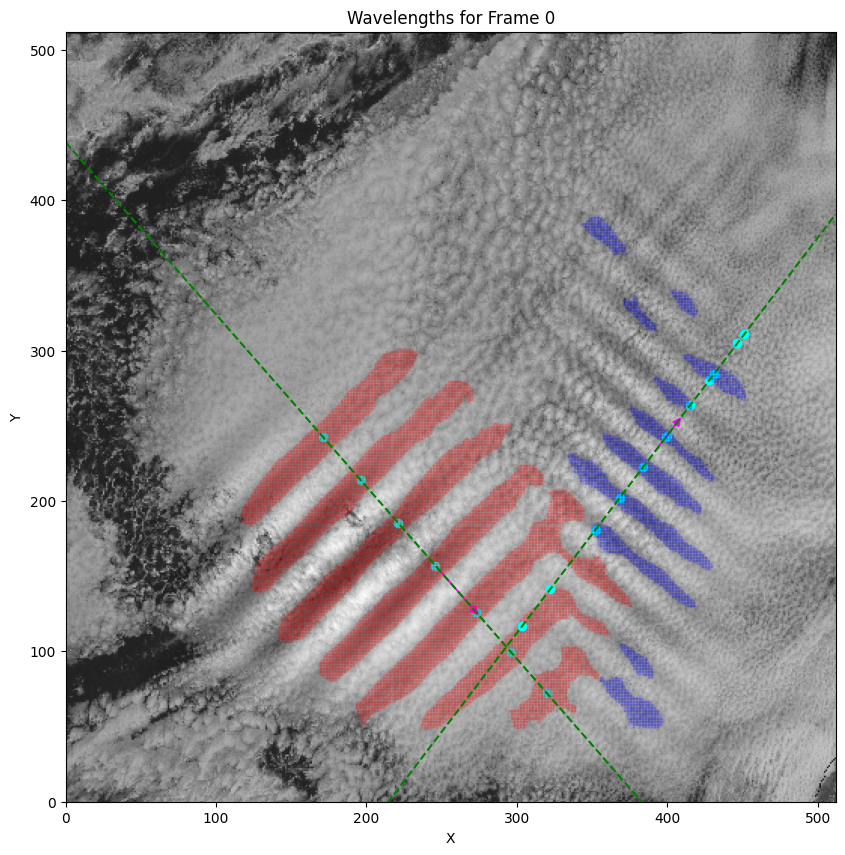

In [25]:
import numpy as np
from sklearn.linear_model import LinearRegression
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
from scipy.spatial.distance import cdist

def average_slope(group):
    slopes = [slope for _, slope, _, _, _ in group]
    return np.mean(slopes)

def perpendicular_slope(avg_slope):
    return -1 / avg_slope

def intersection_points(group, perp_slope, perp_intercept):
    intersection_coords = []
    for _, slope, intercept, coords, _ in group:
        x_intersect = (intercept - perp_intercept) / (perp_slope - slope)
        y_intersect = slope * x_intersect + intercept
        intersection_coords.append((x_intersect, y_intersect))
    return np.array(intersection_coords)


def calculate_median_wavelengths(grouped_clusters):
    median_wavelengths = {}

    for group_idx, group in enumerate(grouped_clusters[0]):
        wavelengths = []

        for frame_idx in range(len(grouped_clusters)):
            current_group = grouped_clusters[frame_idx][group_idx]
            coords = np.vstack([coords for _, _, _, coords, _ in current_group])
            avg_slope = average_slope(current_group)
            perp_slope = perpendicular_slope(avg_slope)
            perp_intercept = total_least_squares(coords, perp_slope)[1]

            intersections = intersection_points(current_group, perp_slope, perp_intercept)
            distances = calculate_distances(intersections)

            if distances.size > 0:
                filtered_distances = filter_outliers(distances)
                if filtered_distances.size > 0:
                    wavelengths.append(np.mean(filtered_distances))

        if wavelengths:
            median_wavelengths[group_idx] = np.median(wavelengths)

    return median_wavelengths

def visualize_wavelengths(grid, grouped_clusters, frame_index, median_wavelengths, show_clusters=False, show_regressions=False):
    plt.figure(figsize=(10, 10))
    plt.imshow(grid[:, :, frame_index], cmap='gray', origin='lower')  # Ensure the image is oriented correctly
    
    colors = ['red', 'blue', 'green', 'purple', 'orange', 'cyan', 'magenta']
    color_map = {label: colors[i % len(colors)] for i, label in enumerate(median_wavelengths.keys())}

    for group_idx, wavelength in median_wavelengths.items():
        color = color_map[group_idx]
        current_group = grouped_clusters[frame_index][group_idx]
        avg_slope = average_slope(current_group)
        perp_slope = perpendicular_slope(avg_slope)
        perp_intercept = total_least_squares(np.vstack([coords for _, _, _, coords, _ in current_group]), perp_slope)[1]

        if show_regressions:
            # Plot the regression lines for each cluster in the group
            for _, slope, intercept, coords, _ in current_group:
                x_vals = np.array([0, grid.shape[1]])
                y_vals = slope * x_vals + intercept
                plt.plot(x_vals, y_vals, color=color, linestyle='-')

        # Center the green line through the cluster
        center_x = np.mean([coords[:, 1].mean() for _, _, _, coords, _ in current_group])
        center_y = np.mean([coords[:, 0].mean() for _, _, _, coords, _ in current_group])
        perp_intercept_centered = center_y - perp_slope * center_x

        # Extend the centered green line to span the entire plot
        x_vals = np.array([0, grid.shape[1]])
        y_vals = perp_slope * x_vals + perp_intercept_centered
        plt.plot(x_vals, y_vals, 'g--')

        # Plot intersection points
        intersections = intersection_points(current_group, perp_slope, perp_intercept_centered)
        for x, y in intersections:
            plt.scatter(x, y, color='cyan')

        # Overlay wavelength with arrow parallel to the green line
        dx = wavelength / np.sqrt(1 + perp_slope**2)
        dy = perp_slope * dx
        plt.arrow(center_x, center_y, dx, dy, head_width=5, head_length=5, fc='magenta', ec='magenta')

        if show_clusters:
            cluster_points = np.vstack([coords for _, _, _, coords, _ in current_group])
            plt.scatter(cluster_points[:, 1], cluster_points[:, 0], color=color, s=1, alpha=0.1)  # Display cluster points with unique color

    plt.title(f'Wavelengths for Frame {frame_index}')
    plt.xlabel('X')
    plt.ylabel('Y')
    plt.xlim(0, grid.shape[1])  # Set x-axis limits
    plt.ylim(0, grid.shape[0])  # Set y-axis limits
    plt.show()

def estimate_wavelengths(grid, grouped_clusters, frame_index, visualization=True, show_clusters=False, show_regressions=False):
    median_wavelengths = calculate_median_wavelengths(grouped_clusters)

    if visualization:
        visualize_wavelengths(grid, grouped_clusters, frame_index, median_wavelengths, show_clusters, show_regressions)

    return median_wavelengths

# # Example usage
wavelengths = estimate_wavelengths(images, grouped_clusters, frame_index=0, visualization=True, show_clusters=True, show_regressions=False)
# wavelengths


## Generation of random cases

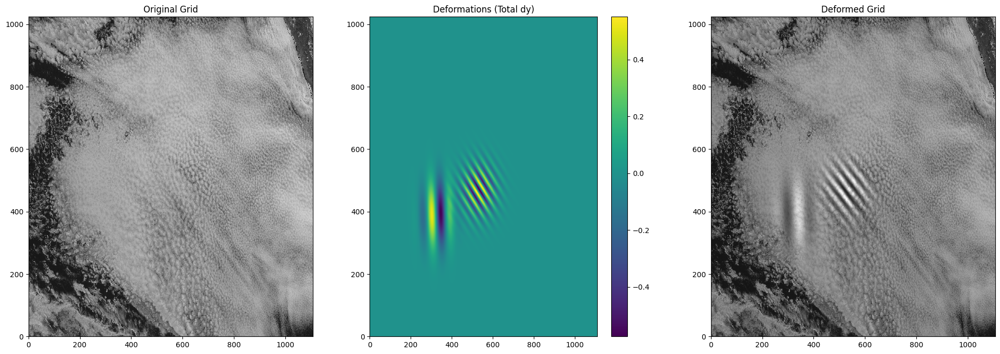

Cluster 0: Speed=64.71 km/h, Wavelength=191.85 km, Direction=267.22 degrees
Cluster 1: Speed=68.02 km/h, Wavelength=60.37 km, Direction=227.06 degrees


In [130]:
def generate_random_waves(num_waves, red, time_steps=10, time_resolution=1800):
    height, width = red.shape[:2]
    x = np.arange(width)
    y = np.arange(height)
    X, Y = np.meshgrid(x, y)

    DX = 2000  # m, pixel size (nominal)
    Xm = (X - X.mean()) * DX
    Ym = (Y - Y.mean()) * DX

    waves_params = []
    for _ in range(num_waves):
        cphase = np.random.uniform(10, 20)  # m/s
        wavelength = np.random.uniform(50, 200) * 1000  # meters
        direction = np.random.uniform(0, 360)  # degrees
        zamplitude = np.random.uniform(50, 150)  # meters
        PBLdepth = 1000  # m, constant

        k = 2 * np.pi / wavelength * np.sin(direction * np.pi / 180)
        l = 2 * np.pi / wavelength * np.cos(direction * np.pi / 180)

        packet_center_x = np.random.uniform(-500, 500) * 1000  # meters
        packet_center_y = np.random.uniform(-500, 500) * 1000  # meters
        packet_width_x = np.random.uniform(100, 500) * 1000  # meters
        packet_width_y = np.random.uniform(100, 500) * 1000  # meters

        Ampwindow = np.exp(-(((Xm - packet_center_x) / packet_width_x) ** 2 + ((Ym - packet_center_y) / packet_width_y) ** 2))

        waves_params.append((cphase, wavelength, direction, zamplitude, k, l, PBLdepth, Ampwindow, packet_center_x, packet_center_y))

    grid = np.zeros((height, width, time_steps))
    total_dy = np.zeros((height, width))
    total_dx = np.zeros((height, width))

    for it in range(time_steps):
        t = it * time_resolution

        dz_total = np.zeros((height, width))
        dx_total = np.zeros((height, width))
        dy_total = np.zeros((height, width))

        for (cphase, wavelength, direction, zamplitude, k, l, PBLdepth, Ampwindow, packet_center_x, packet_center_y) in waves_params:
            dz = zamplitude * np.sin(k * (Xm - cphase * t) + l * (Ym - cphase * t)) * Ampwindow
            dxy = (zamplitude / PBLdepth) * wavelength * np.sin(k * (Xm - cphase * t) + l * (Ym - cphase * t) - np.pi / 2.) / DX
            dx = dxy * np.sin(direction * np.pi / 180.) * Ampwindow
            dy = dxy * np.cos(direction * np.pi / 180.) * Ampwindow

            dz_total += dz
            dx_total += dx
            dy_total += dy

        total_dy += dy_total
        total_dx += dx_total

        grid[:, :, it] = ndimage.map_coordinates(red, [Y - dy_total, X - dx_total], order=1, mode='wrap')
        grid[:, :, it] *= (1 + dz_total / PBLdepth * 5)

    return grid, total_dy, total_dx, waves_params

def visualize_grid(grid, original, total_dy, total_dx):
    fig, ax = plt.subplots(1, 3, figsize=(24, 8))
    
    ax[0].pcolormesh(original, cmap='gray')
    ax[0].set_title('Original Grid')
    
    c = ax[1].pcolormesh(total_dy, shading='auto')
    fig.colorbar(c, ax=ax[1])
    ax[1].set_title('Deformations (Total dy)')
    
    ax[2].pcolormesh(grid[:, :, 0], cmap='gray')
    ax[2].set_title('Deformed Grid')

    plt.show()

def print_wave_parameters(waves_params):
    for i, (cphase, wavelength, direction, zamplitude, k, l, PBLdepth, Ampwindow, packet_center_x, packet_center_y) in enumerate(waves_params):
        speed_kmh = cphase * 3.6  # Convert speed from m/s to km/h
        wavelength_km = wavelength / 1000  # Convert wavelength from m to km
        print(f"Cluster {i}: Speed={speed_kmh:.2f} km/h, Wavelength={wavelength_km:.2f} km, Direction={direction:.2f} degrees")


# Define the path to the directory containing the images
path = 'C:\\Users\\ratynski\\Documents\\Python_Projects\\stratocu_waves-main\\DATA\\2022_09_06\\'
# Use glob to find the images in the specified path
fnames = np.sort(glob(path + '*9_06*png'))
images = []

# Read the images and process them
for i, fname in enumerate(fnames):
    img = imageio.v2.imread(fname)
    red = np.flipud(img[:, 400:, 0])
    images.append(red)  # Just red channel, just 400:end in the x dir, flip y


# # Utilisation de la fonction
# num_waves = np.random.randint(1, 4)
num_waves = 2
red = images[0]
time_steps = 10
time_resolution = 1800

grid, total_dy, total_dx, generated_waves = generate_random_waves(num_waves, red, time_steps, time_resolution)
visualize_grid(grid, red, total_dy, total_dx)

# Print the wave parameters
print_wave_parameters(generated_waves)

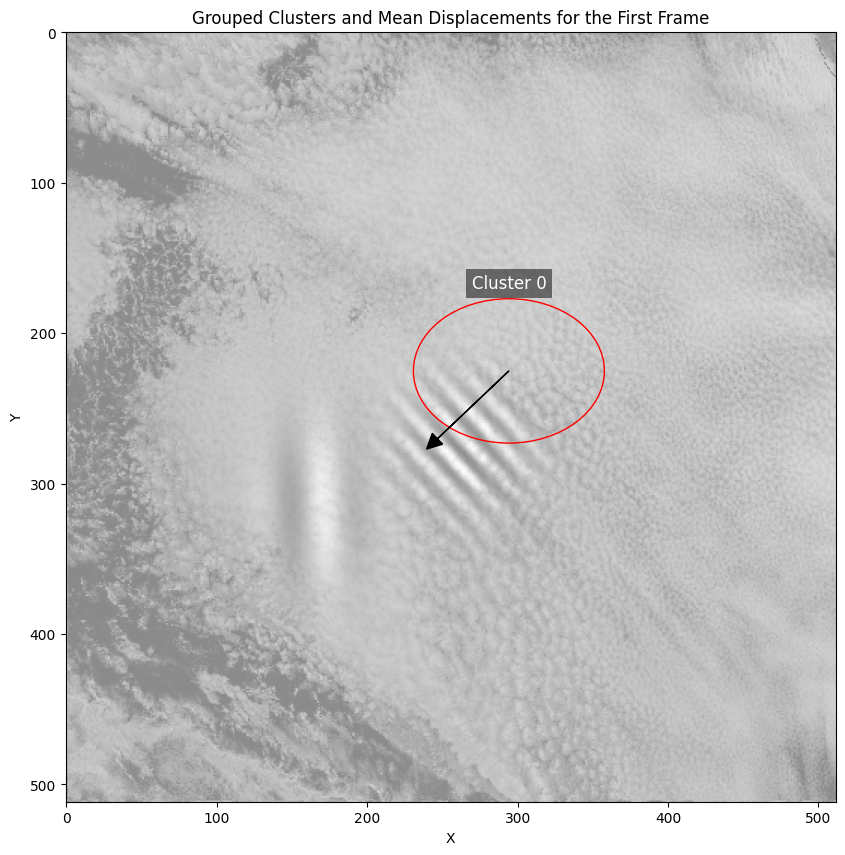

Cluster 0: Center=[225.03873432 294.21822149], Speed=69.86 km/h, Wavelength=178.37 km, Direction=-46.48 degrees


In [131]:
detect_waves(grid, mother='mexh', frame_tick=3, distance_threshold=100, direction_threshold=1,dot_product_threshold=0.999, eps=5, min_samples=50, size_threshold=50)